In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV

#1. Carga de datos

In [6]:
train_df = pd.read_csv(r'C:\Users\Alquileres\Documents\Python\Proyecto Final\Data Set_Archive\train.csv')
test_df = pd.read_csv(r'C:\Users\Alquileres\Documents\Python\Proyecto Final\Data Set_Archive\test.csv')

In [7]:
train_df

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
199997,train_199997,0,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995
199998,train_199998,0,9.7148,-8.6098,13.6104,5.7930,12.5173,0.5339,6.0479,17.0152,...,2.6840,8.6587,2.7337,11.1178,20.4158,-0.0786,6.7980,10.0342,15.5289,-13.9001


In [8]:
test_df

,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,test_0,11.0656,7.7798,12.9536,9.4292,11.4327,-2.3805,5.8493,18.2675,2.1337,...,-2.1556,11.8495,-1.4300,2.4508,13.7112,2.4669,4.3654,10.7200,15.4722,-8.7197
1,test_1,8.5304,1.2543,11.3047,5.1858,9.1974,-4.0117,6.0196,18.6316,-4.4131,...,10.6165,8.8349,0.9403,10.1282,15.5765,0.4773,-1.4852,9.8714,19.1293,-20.9760
2,test_2,5.4827,-10.3581,10.1407,7.0479,10.2628,9.8052,4.8950,20.2537,1.5233,...,-0.7484,10.9935,1.9803,2.1800,12.9813,2.1281,-7.1086,7.0618,19.8956,-23.1794
3,test_3,8.5374,-1.3222,12.0220,6.5749,8.8458,3.1744,4.9397,20.5660,3.3755,...,9.5702,9.0766,1.6580,3.5813,15.1874,3.1656,3.9567,9.2295,13.0168,-4.2108
4,test_4,11.7058,-0.1327,14.1295,7.7506,9.1035,-8.5848,6.8595,10.6048,2.9890,...,4.2259,9.1723,1.2835,3.3778,19.5542,-0.2860,-5.1612,7.2882,13.9260,-9.1846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,test_199995,13.1678,1.0136,10.4333,6.7997,8.5974,-4.1641,4.8579,14.7625,-2.7239,...,2.0544,9.6849,4.6734,-1.3660,12.8721,1.2013,-4.6195,9.1568,18.2102,4.8801
199996,test_199996,9.7171,-9.1462,7.3443,9.1421,12.8936,3.0191,5.6888,18.8862,5.0915,...,5.0071,6.6548,1.8197,2.4104,18.9037,-0.9337,2.9995,9.1112,18.1740,-20.7689
199997,test_199997,11.6360,2.2769,11.2074,7.7649,12.6796,11.3224,5.3883,18.3794,1.6603,...,5.1536,2.6498,2.4937,-0.0637,20.0609,-1.1742,-4.1524,9.1933,11.7905,-22.2762
199998,test_199998,13.5745,-0.5134,13.6584,7.4855,11.2241,-11.3037,4.1959,16.8280,5.3208,...,3.4259,8.5012,2.2713,5.7621,17.0056,1.1763,-2.3761,8.1079,8.7735,-0.2122


In [9]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB


In [10]:
train_df.select_dtypes(include=['object']).columns[0]

'ID_code'

In [11]:
train_df.drop(columns='ID_code', inplace=True)

In [12]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 201 entries, ID_code to var_199
dtypes: float64(200), object(1)
memory usage: 306.7+ MB


In [13]:
test_df.select_dtypes(include=['object']).columns[0]

'ID_code'

In [14]:
test_df.drop(columns='ID_code', inplace=True)

In [15]:
train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
target,200000.0,0.100490,0.300653,0.0000,0.000000,0.00000,0.000000,1.0000
var_0,200000.0,10.679914,3.040051,0.4084,8.453850,10.52475,12.758200,20.3150
var_1,200000.0,-1.627622,4.050044,-15.0434,-4.740025,-1.60805,1.358625,10.3768
var_2,200000.0,10.715192,2.640894,2.1171,8.722475,10.58000,12.516700,19.3530
var_3,200000.0,6.796529,2.043319,-0.0402,5.254075,6.82500,8.324100,13.1883
...,...,...,...,...,...,...,...,...
var_195,200000.0,-0.142088,1.429372,-5.2610,-1.170700,-0.17270,0.829600,4.2729
var_196,200000.0,2.303335,5.454369,-14.2096,-1.946925,2.40890,6.556725,18.3215
var_197,200000.0,8.908158,0.921625,5.9606,8.252800,8.88820,9.593300,12.0004
var_198,200000.0,15.870720,3.010945,6.2993,13.829700,15.93405,18.064725,26.0791


In [16]:
test_df.describe().T

,count,mean,std,min,25%,50%,75%,max
var_0,200000.0,10.658737,3.036716,0.1887,8.442975,10.51380,12.739600,22.3234
var_1,200000.0,-1.624244,4.040509,-15.0434,-4.700125,-1.59050,1.343400,9.3851
var_2,200000.0,10.707452,2.633888,2.3552,8.735600,10.56070,12.495025,18.7141
var_3,200000.0,6.788214,2.052724,-0.0224,5.230500,6.82235,8.327600,13.1420
var_4,200000.0,11.076399,1.616456,5.4844,9.891075,11.09975,12.253400,16.0371
...,...,...,...,...,...,...,...,...
var_195,200000.0,-0.133657,1.429678,-4.9119,-1.160700,-0.16200,0.837900,4.5454
var_196,200000.0,2.290899,5.446346,-13.9442,-1.948600,2.40360,6.519800,15.9207
var_197,200000.0,8.912428,0.920904,6.1696,8.260075,8.89280,9.595900,12.2758
var_198,200000.0,15.869184,3.008717,6.5840,13.847275,15.94340,18.045200,26.5384


#2.Análisis exploratorio de datos (EDA)

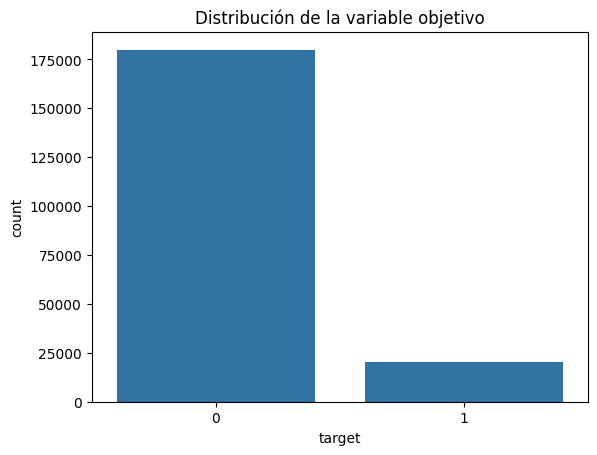

In [17]:
sns.countplot(x='target', data=train_df)
plt.title('Distribución de la variable objetivo')
plt.show()

In [18]:
train_df.isnull().sum()

target     0
var_0      0
var_1      0
var_2      0
var_3      0
          ..
var_195    0
var_196    0
var_197    0
var_198    0
var_199    0
Length: 201, dtype: int64

In [19]:
test_df.isnull().sum()

var_0      0
var_1      0
var_2      0
var_3      0
var_4      0
          ..
var_195    0
var_196    0
var_197    0
var_198    0
var_199    0
Length: 200, dtype: int64

In [20]:
train_df.duplicated().sum()

0

In [21]:
test_df.duplicated().sum()

0

In [22]:
train_df.hist(bins=30, figsize=(200, 100))
plt.tight_layout()
plt.show()

In [23]:
corr_matrix = train_df.corr()
corr_matrix

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
target,1.000000,0.052390,0.050343,0.055870,0.011055,0.010915,0.030979,0.066731,-0.003025,0.019584,...,0.055973,0.047114,-0.042858,-0.017709,-0.022838,0.028285,0.023608,-0.035303,-0.053000,0.025434
var_0,0.052390,1.000000,-0.000544,0.006573,0.003801,0.001326,0.003046,0.006983,0.002429,0.004962,...,0.002752,0.000206,-0.005373,0.001616,-0.001514,0.002073,0.004386,-0.000753,-0.005776,0.003850
var_1,0.050343,-0.000544,1.000000,0.003980,0.000010,0.000303,-0.000902,0.003258,0.001511,0.004098,...,0.006627,0.003621,-0.002604,0.001153,-0.002557,-0.000785,-0.000377,-0.004157,-0.004861,0.002287
var_2,0.055870,0.006573,0.003980,1.000000,0.001001,0.000723,0.001569,0.000883,-0.000991,0.002648,...,0.000197,0.001285,-0.003400,0.000549,0.002104,-0.001070,0.003952,0.001078,-0.000877,0.003855
var_3,0.011055,0.003801,0.000010,0.001001,1.000000,-0.000322,0.003253,-0.000774,0.002500,0.003553,...,0.000151,0.002445,-0.001530,-0.001699,-0.001054,0.001206,-0.002800,0.001164,-0.001651,0.000506
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
var_195,0.028285,0.002073,-0.000785,-0.001070,0.001206,0.003706,-0.001274,0.001244,0.001854,0.001396,...,0.004571,0.000870,-0.004745,-0.003143,-0.001201,1.000000,0.002517,-0.004170,-0.000536,0.002042
var_196,0.023608,0.004386,-0.000377,0.003952,-0.002800,0.000513,0.002880,0.005378,0.001045,-0.003242,...,-0.000847,0.002466,-0.001386,-0.005308,-0.005040,0.002517,1.000000,-0.000454,0.000253,0.000607
var_197,-0.035303,-0.000753,-0.004157,0.001078,0.001164,-0.000046,-0.000535,-0.003565,0.003466,-0.004583,...,-0.004974,0.000906,-0.000527,0.005068,0.000884,-0.004170,-0.000454,1.000000,0.001183,0.004991
var_198,-0.053000,-0.005776,-0.004861,-0.000877,-0.001651,-0.001821,-0.000953,-0.003025,0.000650,0.002950,...,-0.000153,-0.000067,0.003451,0.001646,0.003194,-0.000536,0.000253,0.001183,1.000000,-0.004731


In [24]:
plt.figure(figsize=(200, 100))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Mapa de calor de la correlación entre variables')
plt.show()

#3. Preprocesamiento de datos

In [25]:
train_df = train_df.drop_duplicates()
train_df

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,-0.6209,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,-3.6797,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
199997,0,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,0.1202,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995
199998,0,9.7148,-8.6098,13.6104,5.7930,12.5173,0.5339,6.0479,17.0152,-2.1926,...,2.6840,8.6587,2.7337,11.1178,20.4158,-0.0786,6.7980,10.0342,15.5289,-13.9001


In [26]:
test_df = test_df.drop_duplicates()
test_df

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,11.0656,7.7798,12.9536,9.4292,11.4327,-2.3805,5.8493,18.2675,2.1337,8.8100,...,-2.1556,11.8495,-1.4300,2.4508,13.7112,2.4669,4.3654,10.7200,15.4722,-8.7197
1,8.5304,1.2543,11.3047,5.1858,9.1974,-4.0117,6.0196,18.6316,-4.4131,5.9739,...,10.6165,8.8349,0.9403,10.1282,15.5765,0.4773,-1.4852,9.8714,19.1293,-20.9760
2,5.4827,-10.3581,10.1407,7.0479,10.2628,9.8052,4.8950,20.2537,1.5233,8.3442,...,-0.7484,10.9935,1.9803,2.1800,12.9813,2.1281,-7.1086,7.0618,19.8956,-23.1794
3,8.5374,-1.3222,12.0220,6.5749,8.8458,3.1744,4.9397,20.5660,3.3755,7.4578,...,9.5702,9.0766,1.6580,3.5813,15.1874,3.1656,3.9567,9.2295,13.0168,-4.2108
4,11.7058,-0.1327,14.1295,7.7506,9.1035,-8.5848,6.8595,10.6048,2.9890,7.1437,...,4.2259,9.1723,1.2835,3.3778,19.5542,-0.2860,-5.1612,7.2882,13.9260,-9.1846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,13.1678,1.0136,10.4333,6.7997,8.5974,-4.1641,4.8579,14.7625,-2.7239,6.9937,...,2.0544,9.6849,4.6734,-1.3660,12.8721,1.2013,-4.6195,9.1568,18.2102,4.8801
199996,9.7171,-9.1462,7.3443,9.1421,12.8936,3.0191,5.6888,18.8862,5.0915,6.3545,...,5.0071,6.6548,1.8197,2.4104,18.9037,-0.9337,2.9995,9.1112,18.1740,-20.7689
199997,11.6360,2.2769,11.2074,7.7649,12.6796,11.3224,5.3883,18.3794,1.6603,5.7341,...,5.1536,2.6498,2.4937,-0.0637,20.0609,-1.1742,-4.1524,9.1933,11.7905,-22.2762
199998,13.5745,-0.5134,13.6584,7.4855,11.2241,-11.3037,4.1959,16.8280,5.3208,8.9032,...,3.4259,8.5012,2.2713,5.7621,17.0056,1.1763,-2.3761,8.1079,8.7735,-0.2122


In [27]:
X_train_df = train_df.drop('target', axis=1)
X_train_df

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,5.9525,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,8.2450,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,7.6784,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,-0.6209,5.6669,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,-3.6797,6.0019,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
199997,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,0.1202,6.1629,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995
199998,9.7148,-8.6098,13.6104,5.7930,12.5173,0.5339,6.0479,17.0152,-2.1926,8.7542,...,2.6840,8.6587,2.7337,11.1178,20.4158,-0.0786,6.7980,10.0342,15.5289,-13.9001


In [28]:
y_train = train_df['target']
y_train

0         0
1         0
2         0
3         0
4         0
         ..
199995    0
199996    0
199997    0
199998    0
199999    0
Name: target, Length: 200000, dtype: int64

In [29]:
imputer = SimpleImputer(strategy='mean')
imputer

SimpleImputer()

In [30]:
X_train_imputed = pd.DataFrame(imputer.fit_transform(X_train_df), columns=X_train_df.columns)
X_train_imputed

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,5.9525,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,8.2450,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,7.6784,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,-0.6209,5.6669,...,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,-3.6797,6.0019,...,4.9611,4.6549,0.6998,1.8341,22.2717,1.7337,-2.1651,6.7419,15.9054,0.3388
199997,11.2232,-5.0518,10.5127,5.6456,9.3410,-5.4086,4.5555,21.5571,0.1202,6.1629,...,4.0651,5.4414,3.1032,4.8793,23.5311,-1.5736,1.2832,8.7155,13.8329,4.1995
199998,9.7148,-8.6098,13.6104,5.7930,12.5173,0.5339,6.0479,17.0152,-2.1926,8.7542,...,2.6840,8.6587,2.7337,11.1178,20.4158,-0.0786,6.7980,10.0342,15.5289,-13.9001


In [31]:
X_test_imputed = pd.DataFrame(imputer.transform(test_df), columns=test_df.columns)
X_test_imputed


,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,11.0656,7.7798,12.9536,9.4292,11.4327,-2.3805,5.8493,18.2675,2.1337,8.8100,...,-2.1556,11.8495,-1.4300,2.4508,13.7112,2.4669,4.3654,10.7200,15.4722,-8.7197
1,8.5304,1.2543,11.3047,5.1858,9.1974,-4.0117,6.0196,18.6316,-4.4131,5.9739,...,10.6165,8.8349,0.9403,10.1282,15.5765,0.4773,-1.4852,9.8714,19.1293,-20.9760
2,5.4827,-10.3581,10.1407,7.0479,10.2628,9.8052,4.8950,20.2537,1.5233,8.3442,...,-0.7484,10.9935,1.9803,2.1800,12.9813,2.1281,-7.1086,7.0618,19.8956,-23.1794
3,8.5374,-1.3222,12.0220,6.5749,8.8458,3.1744,4.9397,20.5660,3.3755,7.4578,...,9.5702,9.0766,1.6580,3.5813,15.1874,3.1656,3.9567,9.2295,13.0168,-4.2108
4,11.7058,-0.1327,14.1295,7.7506,9.1035,-8.5848,6.8595,10.6048,2.9890,7.1437,...,4.2259,9.1723,1.2835,3.3778,19.5542,-0.2860,-5.1612,7.2882,13.9260,-9.1846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,13.1678,1.0136,10.4333,6.7997,8.5974,-4.1641,4.8579,14.7625,-2.7239,6.9937,...,2.0544,9.6849,4.6734,-1.3660,12.8721,1.2013,-4.6195,9.1568,18.2102,4.8801
199996,9.7171,-9.1462,7.3443,9.1421,12.8936,3.0191,5.6888,18.8862,5.0915,6.3545,...,5.0071,6.6548,1.8197,2.4104,18.9037,-0.9337,2.9995,9.1112,18.1740,-20.7689
199997,11.6360,2.2769,11.2074,7.7649,12.6796,11.3224,5.3883,18.3794,1.6603,5.7341,...,5.1536,2.6498,2.4937,-0.0637,20.0609,-1.1742,-4.1524,9.1933,11.7905,-22.2762
199998,13.5745,-0.5134,13.6584,7.4855,11.2241,-11.3037,4.1959,16.8280,5.3208,8.9032,...,3.4259,8.5012,2.2713,5.7621,17.0056,1.1763,-2.3761,8.1079,8.7735,-0.2122


In [32]:
X = X_train_imputed
y = y_train

In [33]:
smote = SMOTE(random_state=42)
smote

SMOTE(random_state=42)

In [34]:
X_res, y_res = smote.fit_resample(X, y)
X_res, y_res

(            var_0     var_1      var_2      var_3      var_4     var_5  \
 0        8.925500 -6.786300  11.908100   5.093000  11.460700 -9.283400   
 1       11.500600 -4.147300  13.858800   5.389000  12.362200  7.043300   
 2        8.609300 -2.745700  12.080500   7.892800  10.582500 -9.083700   
 3       11.060400 -2.151800   8.952200   7.195700  12.584600 -1.836100   
 4        9.836900 -1.483400  12.874600   6.637500  12.277200  2.448600   
 ...           ...       ...        ...        ...        ...       ...   
 359799   9.980881  1.128537   9.689273   8.685551  11.367475  4.311130   
 359800   8.263733 -6.374523  10.176439   8.012565  10.487056 -6.407560   
 359801   9.633818 -4.444685  12.226416   6.094215  11.371204 -7.296517   
 359802  12.061192 -0.906522   8.798435  10.399115  12.568341 -6.805017   
 359803  12.957291 -5.085482   7.242919   5.958572  12.610220  3.284545   
 
            var_6      var_7     var_8     var_9  ...   var_190   var_191  \
 0       5.118700  18

In [35]:
scaler = StandardScaler()
scaler

StandardScaler()

In [36]:
X_res_scaled = scaler.fit_transform(X_res)
X_res_scaled

array([[-0.67808017, -1.42151595,  0.39642834, ..., -0.35057929,
        -1.00190415,  0.18307452],
       [ 0.21433988, -0.7303486 ,  1.17107723, ..., -0.08863227,
         0.93904545,  0.49164645],
       [-0.78766163, -0.36326252,  0.46489067, ..., -0.69457361,
        -0.32591189,  0.3339434 ],
       ...,
       [-0.43260729, -0.80823514,  0.52283604, ...,  0.35201549,
         0.44325239,  1.17251275],
       [ 0.40861723,  0.11842734, -0.83846114, ..., -1.56527653,
         1.14702148, -0.92219768],
       [ 0.71916706, -0.97606306, -1.45617711, ...,  1.39018116,
        -0.26241549, -0.11013854]])

In [37]:
X_test_scaled = scaler.transform(X_test_imputed)
X_test_scaled

array([[ 0.06358739,  2.39341879,  0.81161028, ...,  2.15558198,
        -0.06483038, -0.59041366],
       [-0.81500501,  0.68435757,  0.15681018, ...,  1.16938747,
         1.2082379 , -1.83316805],
       [-1.87120809, -2.35698831, -0.30542969, ..., -2.09576936,
         1.47499359, -2.05658662],
       ...,
       [ 0.26126375,  0.95218164,  0.11817106, ...,  0.38133834,
        -1.34646213, -1.96500467],
       [ 0.93306533,  0.22138806,  1.09149573, ..., -0.88005162,
        -2.39670604,  0.27222293],
       [-0.14406982,  0.82911247, -0.27088084, ...,  1.71141094,
        -0.46104768, -0.48797208]])

#4. Entrenamiento de modelos

In [38]:
X_train, X_val, y_train, y_val = train_test_split(X_res_scaled, y_res, test_size=0.3, random_state=42)
X_train, X_val, y_train, y_val

(array([[-0.2628004 ,  0.58915509, -2.20942907, ...,  0.1038186 ,
         -1.86643207, -0.43614798],
        [ 0.10111956, -0.29511483, -0.63058605, ...,  1.43505335,
         -0.83293219, -0.91630423],
        [ 0.86428482, -0.34166286,  0.10452845, ..., -0.09741118,
         -0.75853619,  1.78693559],
        ...,
        [ 2.04256895,  0.61971941, -0.26949094, ..., -1.04867856,
         -0.78176022, -0.79069339],
        [-0.31350175,  2.3065187 ,  0.79103981, ..., -0.93292913,
          1.98438103,  0.02137642],
        [ 0.25045116, -0.53776984, -0.75575616, ...,  1.97033639,
         -1.141078  ,  0.30708329]]),
 array([[-1.05464947,  0.61820036, -0.10405354, ...,  1.11918289,
          1.40390979,  1.16504547],
        [-0.09024189, -0.40480867,  0.58964506, ..., -0.25841403,
         -1.05032865,  1.62988971],
        [ 0.45210552,  0.51236452, -0.89713189, ...,  0.69521554,
          0.21141561,  0.06472463],
        ...,
        [ 0.19275734,  0.87568737, -0.13930203, ..., -

##Regresión logística

In [39]:
log_reg = LogisticRegression()
log_reg

LogisticRegression()

In [40]:
log_reg.fit(X_train, y_train)

LogisticRegression()

In [41]:
y_pred_log_reg = log_reg.predict(X_val)
y_pred_log_reg

array([0, 1, 1, ..., 1, 0, 0], dtype=int64)

In [42]:
print("Resultados de Logistic Regression:")
print(confusion_matrix(y_val, y_pred_log_reg))
print(classification_report(y_val, y_pred_log_reg))
print(f"Accuracy: {accuracy_score(y_val, y_pred_log_reg)}\n")

Resultados de Logistic Regression:
[[42759 11239]
 [10564 43380]]
              precision    recall  f1-score   support

           0       0.80      0.79      0.80     53998
           1       0.79      0.80      0.80     53944

    accuracy                           0.80    107942
   macro avg       0.80      0.80      0.80    107942
weighted avg       0.80      0.80      0.80    107942

Accuracy: 0.7980118952770933



##Random Forest

In [43]:
rf = RandomForestClassifier()
rf

RandomForestClassifier()

In [44]:
rf.fit(X_train, y_train)

RandomForestClassifier()

In [45]:
y_pred_rf = rf.predict(X_val)
y_pred_rf

array([0, 1, 1, ..., 1, 0, 0], dtype=int64)

In [46]:
print("Resultados de Random Forest:")
print(confusion_matrix(y_val, y_pred_rf))
print(classification_report(y_val, y_pred_rf))
print(f"Accuracy: {accuracy_score(y_val, y_pred_rf)}\n")

Resultados de Random Forest:
[[53181   817]
 [ 3204 50740]]
              precision    recall  f1-score   support

           0       0.94      0.98      0.96     53998
           1       0.98      0.94      0.96     53944

    accuracy                           0.96    107942
   macro avg       0.96      0.96      0.96    107942
weighted avg       0.96      0.96      0.96    107942

Accuracy: 0.9627485130903634



##Support Vector Machine

In [47]:
svc = SVC()
svc

SVC()

In [48]:
svc.fit(X_train, y_train)

SVC()

In [49]:
y_pred_svc = svc.predict(X_val)
y_pred_svc

array([0, 1, 1, ..., 1, 0, 0], dtype=int64)

In [50]:
print("Resultados de Support Vector Machine:")
print(confusion_matrix(y_val, y_pred_svc))
print(classification_report(y_val, y_pred_svc))
print(f"Accuracy: {accuracy_score(y_val, y_pred_svc)}\n")

Resultados de Support Vector Machine:
[[51315  2683]
 [ 2890 51054]]
              precision    recall  f1-score   support

           0       0.95      0.95      0.95     53998
           1       0.95      0.95      0.95     53944

    accuracy                           0.95    107942
   macro avg       0.95      0.95      0.95    107942
weighted avg       0.95      0.95      0.95    107942

Accuracy: 0.9483704211521002



#4. Evaluación y validación del modelo

##Regresión logística

In [51]:
param_distributions_lr = {'C': [0.01, 0.1, 1, 10, 100]}
param_distributions_lr

{'C': [0.01, 0.1, 1, 10, 100]}

In [52]:
random_search_lr = RandomizedSearchCV(LogisticRegression(), param_distributions_lr, n_iter=10, cv=3, scoring='accuracy', random_state=42)
random_search_lr

RandomizedSearchCV(cv=3, estimator=LogisticRegression(),
                   param_distributions={'C': [0.01, 0.1, 1, 10, 100]},
                   random_state=42, scoring='accuracy')

In [53]:
random_search_lr.fit(X_train, y_train)

c:\Users\Alquileres\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 5 is smaller than n_iter=10. Running 5 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


RandomizedSearchCV(cv=3, estimator=LogisticRegression(),
                   param_distributions={'C': [0.01, 0.1, 1, 10, 100]},
                   random_state=42, scoring='accuracy')

In [54]:
best_log_reg = random_search_lr.best_estimator_
print(f"Mejores parámetros para Logistic Regression: {random_search_lr.best_params_}")

Mejores parámetros para Logistic Regression: {'C': 0.01}


In [55]:
y_pred_best_log_reg = best_log_reg.predict(X_val)
print("Evaluación del mejor modelo de Logistic Regression:")
print(confusion_matrix(y_val, y_pred_best_log_reg))
print(classification_report(y_val, y_pred_best_log_reg))
print(f"Accuracy: {accuracy_score(y_val, y_pred_best_log_reg)}\n")

Evaluación del mejor modelo de Logistic Regression:
[[42758 11240]
 [10562 43382]]
              precision    recall  f1-score   support

           0       0.80      0.79      0.80     53998
           1       0.79      0.80      0.80     53944

    accuracy                           0.80    107942
   macro avg       0.80      0.80      0.80    107942
weighted avg       0.80      0.80      0.80    107942

Accuracy: 0.7980211595115896



##Random forest

In [56]:
param_distributions_rf = {'n_estimators': [50, 100, 200], 'max_depth': [10, 20, 30]}
param_distributions_rf

{'n_estimators': [50, 100, 200], 'max_depth': [10, 20, 30]}

In [57]:
random_search_rf = RandomizedSearchCV(RandomForestClassifier(), param_distributions_rf, n_iter=10, cv=3, scoring='accuracy', random_state=42)
random_search_rf

RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(),
                   param_distributions={'max_depth': [10, 20, 30],
                                        'n_estimators': [50, 100, 200]},
                   random_state=42, scoring='accuracy')

In [58]:
random_search_rf.fit(X_train, y_train)

c:\Users\Alquileres\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 9 is smaller than n_iter=10. Running 9 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


In [ ]:
best_rf = random_search_rf.best_estimator_
print(f"Mejores parámetros para Random Forest: {random_search_rf.best_params_}")

Mejores parámetros para Random Forest: {'n_estimators': 200, 'max_depth': 30}


In [ ]:
y_pred_best_rf = best_rf.predict(X_val)
print("Evaluación del mejor modelo de Random Forest:")
print(confusion_matrix(y_val, y_pred_best_rf))
print(classification_report(y_val, y_pred_best_rf))
print(f"Accuracy: {accuracy_score(y_val, y_pred_best_rf)}\n")

Evaluación del mejor modelo de Random Forest:
[[51873  2125]
 [ 2587 51357]]
              precision    recall  f1-score   support

           0       0.95      0.96      0.96     53998
           1       0.96      0.95      0.96     53944

    accuracy                           0.96    107942
   macro avg       0.96      0.96      0.96    107942
weighted avg       0.96      0.96      0.96    107942

Accuracy: 0.9563469270534176



##Support vector machine

In [ ]:
param_distributions_svc = {'C': [0.01, 0.1, 1, 10, 100], 'kernel': ['linear', 'rbf']}
param_distributions_svc

{'C': [0.01, 0.1, 1, 10, 100], 'kernel': ['linear', 'rbf']}

In [ ]:
random_search_svc = RandomizedSearchCV(SVC(), param_distributions_svc, n_iter=10, cv=3, scoring='accuracy', random_state=42)
random_search_svc

RandomizedSearchCV(cv=3, estimator=SVC(),
                   param_distributions={'C': [0.01, 0.1, 1, 10, 100],
                                        'kernel': ['linear', 'rbf']},
                   random_state=42, scoring='accuracy')

In [1]:
random_search_svc.fit(X_train, y_train)

NameError: name 'random_search_svc' is not defined

In [ ]:
best_svc = random_search_svc.best_estimator_
print(f"Mejores parámetros para Support Vector Machine: {random_search_svc.best_params_}")

In [ ]:
y_pred_best_svc = best_svc.predict(X_val)
print("Evaluación del mejor modelo de Support Vector Machine:")
print(confusion_matrix(y_val, y_pred_best_svc))
print(classification_report(y_val, y_pred_best_svc))
print(f"Accuracy: {accuracy_score(y_val, y_pred_best_svc)}\n")

NameError: name 'best_svc' is not defined

In [ ]:
sns.countplot(x='target', data=train_df)
plt.title('Distribución de la Variable Objetivo')
plt.show()


In [ ]:
corr = train_df.corr()
sns.heatmap(corr, cmap="coolwarm")
plt.title('Matriz de Correlación de Variables')
plt.show()